# What is web scraping?

**"Web scraping is an automatic method to obtain large amounts of data from websites. Most of this data is unstructured data in an HTML format which is then converted into structured data in a spreadsheet or a database so that it can be used in various applications."**

   __[GeeksForGeeks](https://www.geeksforgeeks.org/what-is-web-scraping-and-how-to-use-it/)__
   
Some exmaples of when you might want to use web scraping:
- Analyze data from job postings  
- Sentiment analysis on comments or reviews 
- Posts and connection data from individuals on a social network

### HTML

**"HTML, or Hypertext Markup Language, is a markup language for the web that defines the structure of web pages."**

__[freeCodeCamp](https://www.freecodecamp.org/news/what-is-html-definition-and-meaning/)__

HTML is how browsers render webpages. Everything that is ever rendered in a browser, will have an HTML doc. **Even this page! Double click on this box, and hit "inspect" at the bottom of the pop up menu.**

HTML documents are made up of a series of nested tags demarcating a specific element of a webpage. Web scraping makes use of the knowledge of these tags, and the nested structure, in order to easily access the information contained in the element.

###  Requests Library
**"Requests is an elegant and simple HTTP library for Python, built for human beings."**

__[Requests Docs](https://requests.readthedocs.io/en/latest/)__


HTTP stands for HyperText Transfer Protocol and is how information travels across the web. For our purposes we will be using the requests library to "request" the html from our webpage

### BeautifulSoup

**"Beautiful Soup is a Python library for pulling data out of HTML and XML files. It works with your favorite parser to provide idiomatic ways of navigating, searching, and modifying the parse tree."**

__[BeautifulSoup4 Docs](https://www.crummy.com/software/BeautifulSoup/bs4/doc/)__

BeautifulSoup objects represent the document as a nested data structure. In this notebook, you will see how this nested structure can be used to simplify retrieving only the data we need


In [386]:
#import statements
import requests
from bs4 import BeautifulSoup
import pandas as pd 
import seaborn as sns

### Now we're going to send a request, using the URL of the exact site and page we're scraping from, in order to get the contents of that page.

Today we will be scraping from __[IMDB's list](https://www.imdb.com/list/ls026128329/?st_dt=&mode=detail&page=1&sort=list_order,asc)__ of 150 great anime movies. 

We're interested in the:
- title 
- runtime
- imdb score
- metascore
- director
</br>
</br>

In [387]:
url = 'https://www.imdb.com/list/ls026128329/?sort=list_order,asc&st_dt=&mode=detail&page=1'
res = requests.get(url)

In [381]:
#If the code above resulted in an error or otherwise failed to receive a response, use this code:
#with open("res.txt", "r") as file:
#    res = file.read()
    

### Let's look at our (res)ult.
</br>

In [388]:
#remember to use "res" if you read in the file 
res.text

'\n\n\n<!DOCTYPE html>\n<html\n    xmlns:og="http://ogp.me/ns#"\n    xmlns:fb="http://www.facebook.com/2008/fbml">\n    <head>\n         \n\n        <meta charset="utf-8">\n\n\n\n\n        <script type="text/javascript">var IMDbTimer={starttime: new Date().getTime(),pt:\'java\'};</script>\n\n<script>\n    if (typeof uet == \'function\') {\n      uet("bb", "LoadTitle", {wb: 1});\n    }\n</script>\n  <script>(function(t){ (t.events = t.events || {})["csm_head_pre_title"] = new Date().getTime(); })(IMDbTimer);</script>\n        <title>150 Great Anime Movies - IMDb</title>\n  <script>(function(t){ (t.events = t.events || {})["csm_head_post_title"] = new Date().getTime(); })(IMDbTimer);</script>\n<script>\n    if (typeof uet == \'function\') {\n      uet("be", "LoadTitle", {wb: 1});\n    }\n</script>\n<script>\n    if (typeof uex == \'function\') {\n      uex("ld", "LoadTitle", {wb: 1});\n    }\n</script>\n\n        <link rel="canonical" href="https://www.imdb.com/list/ls026128329/" />\n   

### That doesn't look too friendly. Using BeautifulSoup, we can parse through the text in a way that more easily allows us to find elements based on their tags.

</br>

In [389]:
#rememebr to use "res" if you read in the file
soup = BeautifulSoup(res.text, 'html.parser')

In [390]:
print(soup)


<!DOCTYPE html>

<html xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://ogp.me/ns#">
<head>
<meta charset="utf-8"/>
<script type="text/javascript">var IMDbTimer={starttime: new Date().getTime(),pt:'java'};</script>
<script>
    if (typeof uet == 'function') {
      uet("bb", "LoadTitle", {wb: 1});
    }
</script>
<script>(function(t){ (t.events = t.events || {})["csm_head_pre_title"] = new Date().getTime(); })(IMDbTimer);</script>
<title>150 Great Anime Movies - IMDb</title>
<script>(function(t){ (t.events = t.events || {})["csm_head_post_title"] = new Date().getTime(); })(IMDbTimer);</script>
<script>
    if (typeof uet == 'function') {
      uet("be", "LoadTitle", {wb: 1});
    }
</script>
<script>
    if (typeof uex == 'function') {
      uex("ld", "LoadTitle", {wb: 1});
    }
</script>
<link href="https://www.imdb.com/list/ls026128329/" rel="canonical"/>
<meta content="http://www.imdb.com/list/ls026128329/" property="og:url">
<script>
    if (typeof uet == 'function')

<div>
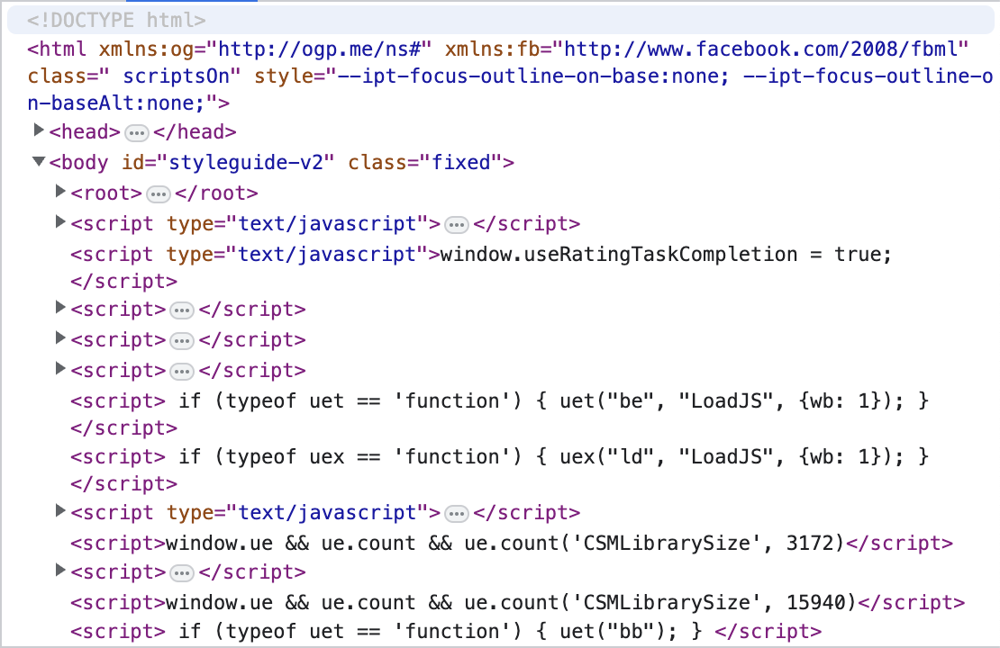
</div>

</br>


### Let's move through this hierarchically, so we can really see the nested structure of this data. Our first stop is at the highest location of the element that contains our data, appropriately given the id "main".

In [391]:
#our target div id
div_id = "main"

#find the content belonging to this tag and id/class
main_section = soup.find("div", id = div_id)

In [392]:
main_section

<div id="main">
<div class="article listo">
<div class="overflow-menu">
<div class="circle">
<div class="vertical-ellipsis">
<svg fill="#000000" height="24" viewbox="0 0 24 24" width="24" xmlns="http://www.w3.org/2000/svg">
<path d="M0 0h24v24H0z" fill="none"></path>
<path d="M12 8c1.1 0 2-.9 2-2s-.9-2-2-2-2 .9-2 2 .9 2 2 2zm0 2c-1.1 0-2 .9-2 2s.9 2 2 2 2-.9 
                            2-2-.9-2-2-2zm0 6c-1.1 0-2 .9-2 2s.9 2 2 2 2-.9 2-2-.9-2-2-2z"></path>
</svg>
</div>
</div>
<div class="pop-up-dialog">
<ul class="pop-up-menu-list-items">
<li><a class="pop-up-menu-list-item-link" href="/list/ls026128329/copy">
Copy from this list
</a></li>
<li><a class="pop-up-menu-list-item-link" href="/list/ls026128329/export">
Export
</a></li>
<li><a class="pop-up-menu-list-item-link" href="/contact?deepLink=list_report&amp;disableLoginPopup=true&amp;list=ls026128329">
Report this list
</a></li>
</ul>
</div>
</div>
<h1 class="header list-name">150 Great Anime Movies</h1>
<span class="list-overview 

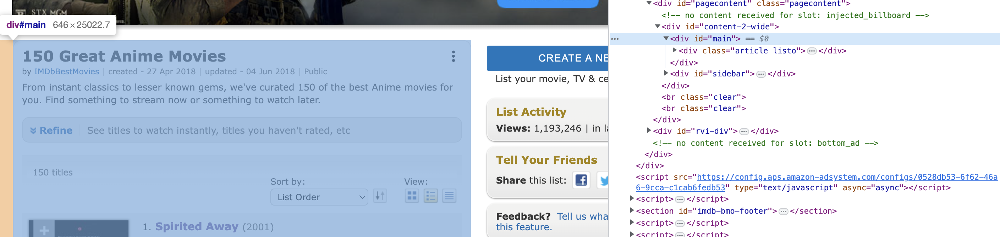


</br>
</br>

### Now let's move to the section of our element that contains a list of the items we're interested in (in this case, movies).

<div>
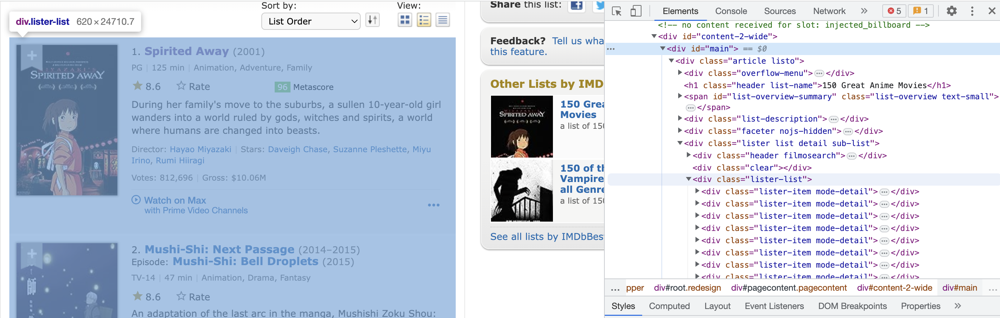
</div>

### As we can see, the div class="lister-list" contains a number of div elements all with the same class name. Each of these corresponds with one entry in our list.

<div>
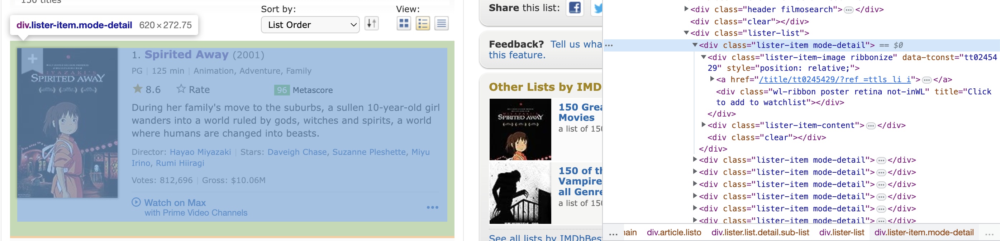
</div>

### Using this information and the find_all() function from BeautifulSoup, we can find all the elements within our main section that is a div of class "lister-item mode-detail". find_all() returns a list containing all found elements.

In [393]:
#our target div class
div_class = "lister-item mode-detail"

#returns a list of movie elements 
list_of_movies = main_section.find_all("div", class_= div_class)

### Now we have our list of movie elements.

In [394]:
#now we have our list of movies
list_of_movies

[<div class="lister-item mode-detail">
 <div class="lister-item-image ribbonize" data-tconst="tt0245429">
 <a href="/title/tt0245429/"> <img alt="Spirited Away" class="loadlate" data-tconst="tt0245429" height="209" loadlate="https://m.media-amazon.com/images/M/MV5BMjlmZmI5MDctNDE2YS00YWE0LWE5ZWItZDBhYWQ0NTcxNWRhXkEyXkFqcGdeQXVyMTMxODk2OTU@._V1_UY209_CR0,0,140,209_AL_.jpg" src="https://m.media-amazon.com/images/S/sash/4FyxwxECzL-U1J8.png" width="140"/>
 </a> </div>
 <div class="lister-item-content">
 <h3 class="lister-item-header">
 <span class="lister-item-index unbold text-primary">1.</span>
 <a href="/title/tt0245429/">Spirited Away</a>
 <span class="lister-item-year text-muted unbold">(2001)</span>
 </h3>
 <p class="text-muted text-small">
 <span class="certificate">PG</span>
 <span class="ghost">|</span>
 <span class="runtime">125 min</span>
 <span class="ghost">|</span>
 <span class="genre">
 Animation, Adventure, Family            </span>
 </p>
 <div class="ipl-rating-widget">
 <

### However, as you can see from the picture above, we're not done searching through tags for our information just yet! Let's go through our first item in our list (a single movie element), and see how we would go about finding our information.

In [395]:
#let's grab the first element of our list
first_movie = list_of_movies[0]
first_movie

<div class="lister-item mode-detail">
<div class="lister-item-image ribbonize" data-tconst="tt0245429">
<a href="/title/tt0245429/"> <img alt="Spirited Away" class="loadlate" data-tconst="tt0245429" height="209" loadlate="https://m.media-amazon.com/images/M/MV5BMjlmZmI5MDctNDE2YS00YWE0LWE5ZWItZDBhYWQ0NTcxNWRhXkEyXkFqcGdeQXVyMTMxODk2OTU@._V1_UY209_CR0,0,140,209_AL_.jpg" src="https://m.media-amazon.com/images/S/sash/4FyxwxECzL-U1J8.png" width="140"/>
</a> </div>
<div class="lister-item-content">
<h3 class="lister-item-header">
<span class="lister-item-index unbold text-primary">1.</span>
<a href="/title/tt0245429/">Spirited Away</a>
<span class="lister-item-year text-muted unbold">(2001)</span>
</h3>
<p class="text-muted text-small">
<span class="certificate">PG</span>
<span class="ghost">|</span>
<span class="runtime">125 min</span>
<span class="ghost">|</span>
<span class="genre">
Animation, Adventure, Family            </span>
</p>
<div class="ipl-rating-widget">
<div class="ipl-ratin

</br>

### Finding the content we want.

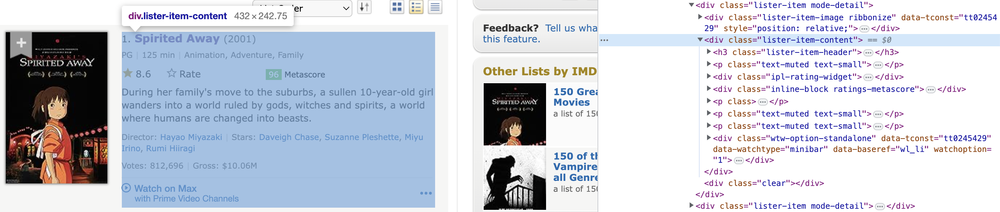

In [396]:
#let's start by locating the content instead of the ribbon
content = first_movie.find("div", class_ = "lister-item-content")
print(content.prettify())

<div class="lister-item-content">
 <h3 class="lister-item-header">
  <span class="lister-item-index unbold text-primary">
   1.
  </span>
  <a href="/title/tt0245429/">
   Spirited Away
  </a>
  <span class="lister-item-year text-muted unbold">
   (2001)
  </span>
 </h3>
 <p class="text-muted text-small">
  <span class="certificate">
   PG
  </span>
  <span class="ghost">
   |
  </span>
  <span class="runtime">
   125 min
  </span>
  <span class="ghost">
   |
  </span>
  <span class="genre">
   Animation, Adventure, Family
  </span>
 </p>
 <div class="ipl-rating-widget">
  <div class="ipl-rating-star small">
   <span class="ipl-rating-star__star">
    <svg class="ipl-icon ipl-star-icon" fill="#000000" height="24" viewbox="0 0 24 24" width="24" xmlns="http://www.w3.org/2000/svg">
     <path d="M0 0h24v24H0z" fill="none">
     </path>
     <path d="M12 17.27L18.18 21l-1.64-7.03L22 9.24l-7.19-.61L12 2 9.19 8.63 2 9.24l5.46 4.73L5.82 21z">
     </path>
     <path d="M0 0h24v24H0z" fill="no

</br>

### Finding the title.

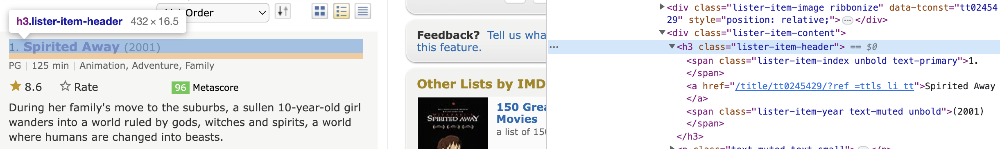

In [397]:
#we can do either .get_text() to retrieve the text from the doc...
title = content.find("a").get_text()
title

'Spirited Away'

</br>

### Finding the runtime. 

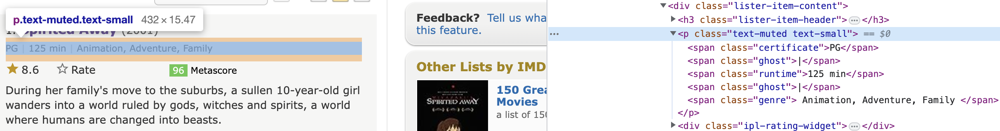

In [398]:
#...or we can use the contents attribute to put the text into a list, and select it from there
runtime = content.find("span", class_="runtime").contents[0]
runtime

'125 min'

</br>

### Finding the IMDB rating.

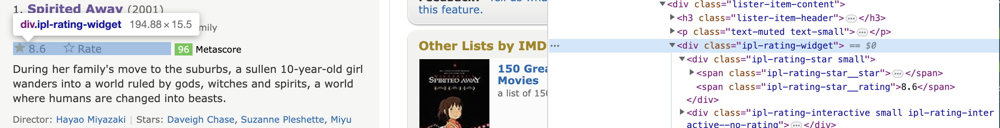

In [399]:
imdb_rating = content.find("span", class_="ipl-rating-star__rating").contents[0]
rating

'8.6'

</br>

### Finding the metascore rating.

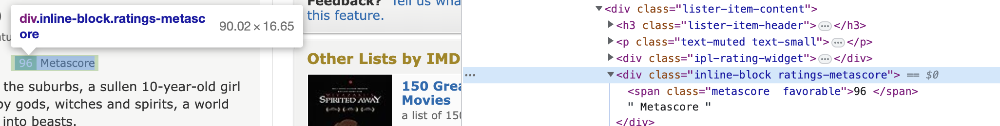

In [400]:
#metascore rating
metascore_rating = content.find("span", class_ = "metascore favorable").contents[0]
metascore_rating

'96        '

</br>

### Finding the director.

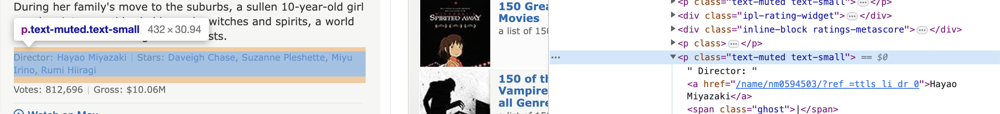

In [401]:
#director
director = content.find_all('p', class_ = "text-muted text-small")[1].find('a').contents[0]
director

'Hayao Miyazaki'

</br>

### Great! Now we found all the information we need for one movie...but what about all the other ones? Since in this example the structure of each item is very similar, we can use what we've found out to create a for loop that does this for each movie element.

### The only difference is that some have a metascore, and some don't. No problem! We can use what we learned about if/else statements to control the flow of our scraping and handle each situation.

In [402]:
#let's instantiate a list to hold all of our table rows 
movie_info_table = list()

In [403]:
for movie in list_of_movies:
    
    #a dictionary to store our table row in, this will make it easy to convert our info into a dataframe
    table_row = {}
    
    #look at the content div
    content = movie.find("div", class_ = "lister-item-content")
    
    #extract the necessary information using the structure we found above and add it to our table
    title = content.find("a").contents[0]
    table_row['Title'] = title
    
    #getting our runtime
    runtime = content.find("span", class_="runtime").contents[0]
    table_row['Runtime'] = runtime
    
    #getting our imdb rating
    imdb_rating = content.find("span", class_="ipl-rating-star__rating").contents[0]
    table_row['IMDB_Rating'] = imdb_rating
    
    #check if there is a metascore rating
    if content.find("span", class_ = "metascore favorable") != None:
        metascore_rating = content.find("span", class_ = "metascore favorable").contents[0]
    else:
        metascore_rating = None
    table_row['Metascore_Rating'] = metascore_rating
    
    #getting our director 
    director = content.find_all('p', class_ = "text-muted text-small")[1].find('a').contents[0]
    table_row['Director'] = director
    
    #proof by print statement 
    print(title, runtime, imdb_rating, metascore_rating, director)
    
    #let's go ahead and add our row to our list
    movie_info_table.append(table_row)


Spirited Away 125 min 8.6 96         Hayao Miyazaki
 Mushi-Shi: Next Passage 47 min 8.6 None Hiroshi Nagahama
Grave of the Fireflies 89 min 8.5 94         Isao Takahata
Princess Mononoke 134 min 8.3 76         Hayao Miyazaki
Your Name. 106 min 8.4 81         Makoto Shinkai
Neon Genesis Evangelion: The End of Evangelion 87 min 8.1 None Hideaki Anno
The House of Small Cubes 12 min 8.2 None Kunio Kato
Howl's Moving Castle 119 min 8.2 82         Hayao Miyazaki
My Neighbor Totoro 86 min 8.1 86         Hayao Miyazaki
Wolf Children 117 min 8.1 71         Mamoru Hosoda
A Silent Voice: The Movie 130 min 8.1 78         Naoko Yamada
Kuroko's Basketball: Last Game 91 min 7.7 None Shunsuke Tada
Akira 124 min 8 67         Katsuhiro Ôtomo
Nausicaä of the Valley of the Wind 117 min 8 86         Hayao Miyazaki
Castle in the Sky 125 min 8 78         Hayao Miyazaki
The Tale of The Princess Kaguya 137 min 8 89         Isao Takahata
Barefoot Gen 83 min 8 None Mori Masaki
The Disappearance of Haruhi Suzumiy

### Now if we look at our list, we see our table and information begin to come together.

In [404]:
movie_info_table

[{'Title': 'Spirited Away',
  'Runtime': '125 min',
  'IMDB_Rating': '8.6',
  'Metascore_Rating': '96        ',
  'Director': 'Hayao Miyazaki'},
 {'Title': ' Mushi-Shi: Next Passage',
  'Runtime': '47 min',
  'IMDB_Rating': '8.6',
  'Metascore_Rating': None,
  'Director': 'Hiroshi Nagahama'},
 {'Title': 'Grave of the Fireflies',
  'Runtime': '89 min',
  'IMDB_Rating': '8.5',
  'Metascore_Rating': '94        ',
  'Director': 'Isao Takahata'},
 {'Title': 'Princess Mononoke',
  'Runtime': '134 min',
  'IMDB_Rating': '8.3',
  'Metascore_Rating': '76        ',
  'Director': 'Hayao Miyazaki'},
 {'Title': 'Your Name.',
  'Runtime': '106 min',
  'IMDB_Rating': '8.4',
  'Metascore_Rating': '81        ',
  'Director': 'Makoto Shinkai'},
 {'Title': 'Neon Genesis Evangelion: The End of Evangelion',
  'Runtime': '87 min',
  'IMDB_Rating': '8.1',
  'Metascore_Rating': None,
  'Director': 'Hideaki Anno'},
 {'Title': 'The House of Small Cubes',
  'Runtime': '12 min',
  'IMDB_Rating': '8.2',
  'Metasco

### But wait, there's more! Our list spans two webpages. In order to continue scraping our list, we have to turn to the next page. What's different about our url?

In [405]:
url2 = 'https://www.imdb.com/list/ls026128329/?sort=list_order,asc&st_dt=&mode=detail&page=2'
res2 = requests.get(url2)

In [406]:
res2.text

'\n\n\n<!DOCTYPE html>\n<html\n    xmlns:og="http://ogp.me/ns#"\n    xmlns:fb="http://www.facebook.com/2008/fbml">\n    <head>\n         \n\n        <meta charset="utf-8">\n\n\n\n\n        <script type="text/javascript">var IMDbTimer={starttime: new Date().getTime(),pt:\'java\'};</script>\n\n<script>\n    if (typeof uet == \'function\') {\n      uet("bb", "LoadTitle", {wb: 1});\n    }\n</script>\n  <script>(function(t){ (t.events = t.events || {})["csm_head_pre_title"] = new Date().getTime(); })(IMDbTimer);</script>\n        <title>150 Great Anime Movies - IMDb</title>\n  <script>(function(t){ (t.events = t.events || {})["csm_head_post_title"] = new Date().getTime(); })(IMDbTimer);</script>\n<script>\n    if (typeof uet == \'function\') {\n      uet("be", "LoadTitle", {wb: 1});\n    }\n</script>\n<script>\n    if (typeof uex == \'function\') {\n      uex("ld", "LoadTitle", {wb: 1});\n    }\n</script>\n\n        <link rel="canonical" href="https://www.imdb.com/list/ls026128329/" />\n   

In [407]:
soup2 = BeautifulSoup(res2.content, "html.parser")

### We can skip a few steps we did before, since now we know exactly where the content we want is.

In [408]:
list_of_movies2 = soup2.find_all("div", class_= div_class)

In [409]:
list_of_movies2

[<div class="lister-item mode-detail">
 <div class="lister-item-image ribbonize" data-tconst="tt0439533">
 <a href="/title/tt0439533/"> <img alt="Dead Leaves" class="loadlate" data-tconst="tt0439533" height="209" loadlate="https://m.media-amazon.com/images/M/MV5BZTk1YjY0OWUtNGUwNy00YzJmLThlNWItMTBlOTBkYWFhNTY2XkEyXkFqcGdeQXVyMTA0MTM5NjI2._V1_UX140_CR0,0,140,209_AL_.jpg" src="https://m.media-amazon.com/images/S/sash/4FyxwxECzL-U1J8.png" width="140"/>
 </a> </div>
 <div class="lister-item-content">
 <h3 class="lister-item-header">
 <span class="lister-item-index unbold text-primary">101.</span>
 <a href="/title/tt0439533/">Dead Leaves</a>
 <span class="lister-item-year text-muted unbold">(2004)</span>
 </h3>
 <p class="text-muted text-small">
 <span class="certificate">Not Rated</span>
 <span class="ghost">|</span>
 <span class="runtime">55 min</span>
 <span class="ghost">|</span>
 <span class="genre">
 Animation, Action, Adventure            </span>
 </p>
 <div class="ipl-rating-widget"

In [410]:
#Now we do the exact same thing we did above
for movie in list_of_movies2:
    
    #a dictionary to store our table row in 
    table_row = {}
    
    #look at the content div
    content = movie.find("div", class_ = "lister-item-content")
    
    #extract the necessary information using the structure we found above and add it to our table
    title = content.find("a").contents[0]
    table_row['Title'] = title
    
    runtime = content.find("span", class_="runtime").contents[0]
    table_row['Runtime'] = runtime
    
    imdb_rating = content.find("span", class_="ipl-rating-star__rating").contents[0]
    table_row['IMDB_Rating'] = imdb_rating
    
    #check if there is a metascore rating
    if content.find("span", class_ = "metascore favorable") != None:
        metascore_rating = content.find("span", class_ = "metascore favorable").contents[0]
    else:
        metascore_rating = None 
    table_row['Metascore_Rating'] = metascore_rating
        
    director = content.find_all('p', class_ = "text-muted text-small")[1].find('a').contents[0]
    table_row['Director'] = director
    
    print(title, runtime, imdb_rating, metascore_rating, director)
    movie_info_table.append(table_row)

Dead Leaves 55 min 7.1 None Hiroyuki Imaishi
Ah! My Goddess: The Movie 106 min 6.9 None Hiroaki Gôda
Vampire Hunter D 80 min 7 None Toyoo Ashida
Children Who Chase Lost Voices 116 min 7.1 None Makoto Shinkai
Little Nemo: Adventures in Slumberland 85 min 7.1 None Masami Hata
Neo Tokyo 50 min 7 None Yoshiaki Kawajiri
Robot Carnival 90 min 6.8 None Atsuko Fukushima
Kenji Miyazawa's Night on the Galactic Railroad 113 min 7 None Gisaburô Sugii
The Garden of Sinners: A Study in Murder - Part 1 61 min 7.1 None Takuya Nonaka
The Place Promised in Our Early Days 90 min 6.9 None Makoto Shinkai
Appleseed: Ex Machina 105 min 7 None Shinji Aramaki
Patlabor: The Movie 100 min 7 None Mamoru Oshii
Piano no mori 101 min 7.1 None Masayuki Kojima
Project A-Ko 86 min 6.9 None Katsuhiko Nishijima
Genius Party 102 min 6.9 None Atsuko Fukushima
Phoenix 2772 122 min 6.8 None Taku Sugiyama
Gauche the Cellist 60 min 7 None Isao Takahata
Short Peace 72 min 6.8 None Hiroaki Andô
A Thousand & One Nights 128 min 6.

### Now the list version of our table has all of the elements from the list. 

In [411]:
movie_info_table

[{'Title': 'Spirited Away',
  'Runtime': '125 min',
  'IMDB_Rating': '8.6',
  'Metascore_Rating': '96        ',
  'Director': 'Hayao Miyazaki'},
 {'Title': ' Mushi-Shi: Next Passage',
  'Runtime': '47 min',
  'IMDB_Rating': '8.6',
  'Metascore_Rating': None,
  'Director': 'Hiroshi Nagahama'},
 {'Title': 'Grave of the Fireflies',
  'Runtime': '89 min',
  'IMDB_Rating': '8.5',
  'Metascore_Rating': '94        ',
  'Director': 'Isao Takahata'},
 {'Title': 'Princess Mononoke',
  'Runtime': '134 min',
  'IMDB_Rating': '8.3',
  'Metascore_Rating': '76        ',
  'Director': 'Hayao Miyazaki'},
 {'Title': 'Your Name.',
  'Runtime': '106 min',
  'IMDB_Rating': '8.4',
  'Metascore_Rating': '81        ',
  'Director': 'Makoto Shinkai'},
 {'Title': 'Neon Genesis Evangelion: The End of Evangelion',
  'Runtime': '87 min',
  'IMDB_Rating': '8.1',
  'Metascore_Rating': None,
  'Director': 'Hideaki Anno'},
 {'Title': 'The House of Small Cubes',
  'Runtime': '12 min',
  'IMDB_Rating': '8.2',
  'Metasco

In [412]:
len(movie_info_table)

150

### Finally, we can turn our data into a dataframe.

In [413]:
movie_df = pd.DataFrame(movie_info_table)

## Tada! Now we can work with our data the way we can work with any data in a dataframe. Let's take some other steps to make sure we can maximize the use of our data.

In [414]:
movie_df

,Title,Runtime,IMDB_Rating,Metascore_Rating,Director
0,Spirited Away,125 min,8.6,96,Hayao Miyazaki
1,Mushi-Shi: Next Passage,47 min,8.6,None,Hiroshi Nagahama
2,Grave of the Fireflies,89 min,8.5,94,Isao Takahata
3,Princess Mononoke,134 min,8.3,76,Hayao Miyazaki
4,Your Name.,106 min,8.4,81,Makoto Shinkai
5,Neon Genesis Evangelion: The End of Evangelion,87 min,8.1,None,Hideaki Anno
6,The House of Small Cubes,12 min,8.2,None,Kunio Kato
7,Howl's Moving Castle,119 min,8.2,82,Hayao Miyazaki
8,My Neighbor Totoro,86 min,8.1,86,Hayao Miyazaki
9,Wolf Children,117 min,8.1,71,Mamoru Hosoda


### As we can see below, runtime, imdb score, and metascore are currently objects. In order to manipulate these columns numerically and ask a more full range of questions, we need to convert these columns into numeric types instead of objects.

In [415]:
movie_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Title             150 non-null    object
 1   Runtime           150 non-null    object
 2   IMDB_Rating       150 non-null    object
 3   Metascore_Rating  45 non-null     object
 4   Director          150 non-null    object
dtypes: object(5)
memory usage: 6.0+ KB


### To convert runtime to a numeric column, we need to strip each row in the column of any non-numeric characters. Don't worry if this line looks crazy to you! It's just one example of how powerful pandas can be once you know all the tools at your disposal. 

In [416]:
movie_df['Runtime'] = pd.to_numeric(movie_df.Runtime.apply(lambda el: el.strip(' min')))

In [417]:
movie_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Title             150 non-null    object
 1   Runtime           150 non-null    int64 
 2   IMDB_Rating       150 non-null    object
 3   Metascore_Rating  45 non-null     object
 4   Director          150 non-null    object
dtypes: int64(1), object(4)
memory usage: 6.0+ KB


### We successfully transformed runtime into a numeric type. Now let's do the same to IMDB_Rating and Metscore_Rating. 

In [418]:
movie_df['IMDB_Rating'] = pd.to_numeric(movie_df['IMDB_Rating'])

In [419]:
movie_df['Metascore_Rating'] = pd.to_numeric(movie_df['Metascore_Rating'])

In [420]:
movie_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Title             150 non-null    object 
 1   Runtime           150 non-null    int64  
 2   IMDB_Rating       150 non-null    float64
 3   Metascore_Rating  45 non-null     float64
 4   Director          150 non-null    object 
dtypes: float64(2), int64(1), object(2)
memory usage: 6.0+ KB


### Now let's create a dataframe where we only keep rows that have both an IMDB_Rating and a Metascore_Rating in order to run analyses that require both.

In [421]:
non_null_movie_df = movie_df.dropna()

In [422]:
non_null_movie_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45 entries, 0 to 121
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Title             45 non-null     object 
 1   Runtime           45 non-null     int64  
 2   IMDB_Rating       45 non-null     float64
 3   Metascore_Rating  45 non-null     float64
 4   Director          45 non-null     object 
dtypes: float64(2), int64(1), object(2)
memory usage: 2.1+ KB


### Now we are ready to ask questions of our data! Like, what is the average IMDB and metascore rating across all movies each director has done?

In [423]:
pd.set_option('display.max_rows', None)
#Average metacritic/imdb score by director
movie_df.groupby(movie_df['Director'])[['Metascore_Rating', 'IMDB_Rating']].mean()

,Metascore_Rating,IMDB_Rating
Director,,
Andrew Chan,NaN,6.500000
Atsuko Fukushima,NaN,6.850000
Daisuke Nishio,NaN,7.800000
Edward Mannix,NaN,7.800000
Eiichi Yamamoto,70.00,6.900000
Fumihiko Sori,NaN,6.800000
Gisaburô Sugii,NaN,7.100000
Gorô Miyazaki,71.00,7.400000
Hayao Miyazaki,83.00,7.963636


### Who is the director with the highest number of movies made?

In [424]:
#Director with the highest number of movies
movie_df.groupby(movie_df['Director'])['Title'].count().sort_values(ascending = False)

Director
Hayao Miyazaki          11
Isao Takahata            8
Mamoru Oshii             7
Makoto Shinkai           6
Yoshiaki Kawajiri        5
Satoshi Kon              4
Mamoru Hosoda            4
Hiroyuki Kitakubo        3
Toshiyuki Kubooka        3
Rintarô                  3
Yukihiro Miyamoto        3
Tatsuya Oishi            3
Katsuhiro Ôtomo          2
Keiichi Hara             2
Takayuki Hirao           2
Masaaki Yuasa            2
Hiroyuki Okiura          2
Naoko Yamada             2
Toyoo Ashida             2
Hiromasa Yonebayashi     2
Atsuko Fukushima         2
Gisaburô Sugii           2
Eiichi Yamamoto          2
Yoshiyuki Tomino         2
Shin'ichirô Watanabe     1
Shinji Aramaki           1
Taiji Yabushita          1
Shunsuke Tada            1
Shigeyasu Yamauchi       1
Sunao Katabuchi          1
Seiji Mizushima          1
Ryôtarô Makihara         1
Peter Chung              1
Tadanari Okamoto         1
Andrew Chan              1
Takahiro Ômori           1
Tsuneo Kobayashi   

### Who are the directors with the fewest number of movies?

In [425]:
#Director with the lowest number of movies 
movie_df.groupby(movie_df['Director'])['Title'].count().sort_values()

Director
Andrew Chan              1
Shinji Aramaki           1
Shin'ichirô Watanabe     1
Shigeyasu Yamauchi       1
Seiji Mizushima          1
Ryôtarô Makihara         1
Peter Chung              1
Osamu Dezaki             1
Shunsuke Tada            1
Noboru Ishiguro          1
Mori Masaki              1
Moon-saeng Kim           1
Mizuho Nishikubo         1
Mitsuyo Seo              1
Mitsuru Obunai           1
Masayuki Kojima          1
Masayuki                 1
Munehisa Sakai           1
Masami Hata              1
Sunao Katabuchi          1
Taiji Yabushita          1
Yoshio Kuroda            1
Yoshikazu Yasuhiko       1
Yoshifumi Kondô          1
Yasuomi Umetsu           1
Yasunao Aoki             1
Yasuhiro Yoshiura        1
Tsuneo Kobayashi         1
Tadanari Okamoto         1
Tomomi Mochizuki         1
Tatsuya Nagamine         1
Tatsuya Ishihara         1
Tatsuo Satô              1
Takuya Nonaka            1
Taku Sugiyama            1
Takeshi Koike            1
Takahiro Ômori     

### Who made the longest movie? What's the title, and the rating scores?

In [426]:
#Longest movie 
movie_df[movie_df['Runtime'] == movie_df['Runtime'].max()]

,Title,Runtime,IMDB_Rating,Metascore_Rating,Director
17,The Disappearance of Haruhi Suzumiya,162,8.0,NaN,Tatsuya Ishihara


### What about the shortest one?

In [427]:
#Shortest movie
#rows in movie_df where movie_df['Runtime'] is equal to the minimum value of 'Runtime'
movie_df[movie_df['Runtime'] == movie_df['Runtime'].min()]

,Title,Runtime,IMDB_Rating,Metascore_Rating,Director
6,The House of Small Cubes,12,8.2,NaN,Kunio Kato


### What is the correlation between the IMDB Rating of a movie and the Metascore rating?

In [428]:
#Correlation between imdb + metacritic 
non_null_movie_df[['IMDB_Rating', 'Metascore_Rating']].corr()

,IMDB_Rating,Metascore_Rating
IMDB_Rating,1.00000,0.49068
Metascore_Rating,0.49068,1.00000


### What about the correlation between runtime and the metascore rating?

In [429]:
#Correlation between runtime and rating
non_null_movie_df[['Runtime', 'Metascore_Rating']].corr()

,Runtime,Metascore_Rating
Runtime,1.00000,0.13788
Metascore_Rating,0.13788,1.00000


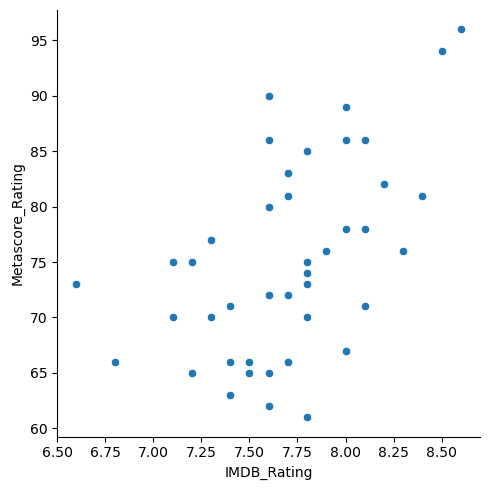

In [431]:
sns.relplot(data = non_null_movie_df, x = "IMDB_Rating", y = "Metascore_Rating")

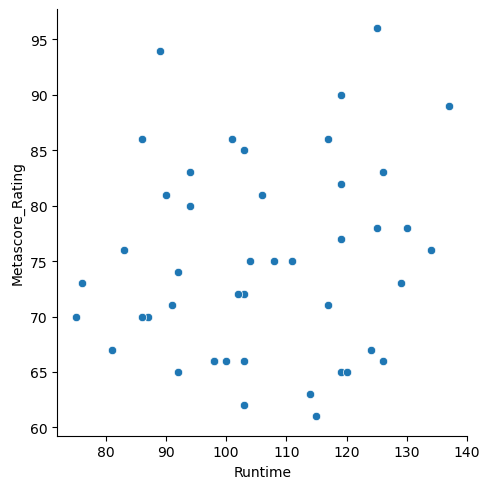

In [432]:
sns.relplot(data = non_null_movie_df, x = "Runtime", y = "Metascore_Rating")

/var/folders/v0/h80vb43j24b4wfmk28p4n8k40000gn/T/ipykernel_53962/1317041557.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(non_null_movie_df.corr())


<Axes: >

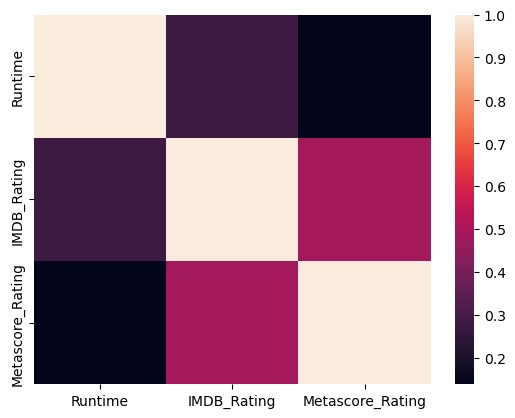

In [433]:
sns.heatmap(non_null_movie_df.corr())